# PURPOSE OF THE NOTEBOOK

This notebook is used to identify cell populations from a Xenium dataset. The analysis is based on Scanpy (documentation in  https://scanpy.readthedocs.io/en/stable/index.html) and Squidpy (documentation in https://squidpy.readthedocs.io/en/stable/).
In this specific notebook, we apply it to identify cell types in the ms coronal sections profiled with xenium

## Loading the packages

We import the packages needed for it. If something fails, means that we haven't installed something in the environment

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import xb.plotting as xp
from xb.plotting import map_of_clusters
import scipy as sp
from xb.calculating import domainassign
import matplotlib
import json
from tqdm import tqdm

# 1. Importing the data and creating an anndata object

We import the adata object for each of the three technical replicates. We remove articitial/control genes and we add a tag to every cell to distinguish the replicate they are comming from

In [ ]:
adata1=sc.read(r"../../data/unprocessed_adata/ms_brain_multisection1_nuclei.h5ad")

In [4]:
adata1=adata1[:,adata1.var['in_panel'].isin(['gene'])]
adata1.obs['replicate']='1'
adata2=sc.read(r"../../data/unprocessed_adata/msbrain_multisection2_nuclei.h5ad")
adata2=adata2[:,adata2.var['in_panel'].isin(['gene'])]
adata2.obs['replicate']='2'
adata3=sc.read(r"../../data/unprocessed_adata/msbrain_multisection3_nuclei.h5ad")
adata3=adata3[:,adata3.var['in_panel'].isin(['gene'])]
adata3.obs['replicate']='3'

/home/sergio/anaconda3/envs/xb/lib/python3.7/site-packages/ipykernel_launcher.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  


We make gene freq.by replicate plots

In [ ]:
spots1=adata1.uns['spots']
spots2=adata2.uns['spots']
spots3=adata3.uns['spots']
spots1['replicate']='1'
spots2['replicate']='2'
spots3['replicate']='3'
spots12=pd.concat([spots1,spots2])
spots123=pd.concat([spots12,spots3])

In [ ]:
spots123['qv_mean']=spots123['qv'].round(-1)
quality=pd.crosstab(spots123['replicate'],spots123['qv_mean'])

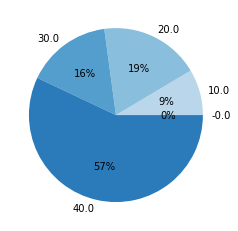

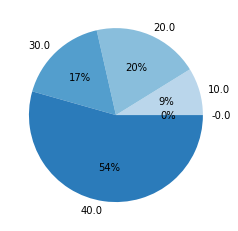

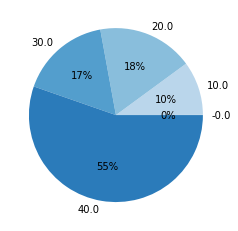

In [10]:
colors = sns.color_palette('Blues')[0:5]
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
#create pie chart
plt.pie(quality.iloc[0,:], labels = quality.columns, colors = colors, autopct='%.0f%%')
plt.savefig('../../figures/celltype_identification_multisection/quality_pie1.pdf')
plt.show()
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
#create pie chart
plt.pie(quality.iloc[1,:], labels = quality.columns, colors = colors, autopct='%.0f%%')
plt.savefig('../../figures/celltype_identification_multisection/quality_pie2.pdf')
plt.show()
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
#create pie chart
plt.pie(quality.iloc[2,:], labels = quality.columns, colors = colors, autopct='%.0f%%')
plt.savefig('../../figures/celltype_identification_multisection/quality_pie3.pdf')
plt.show()

In [11]:
colordict=dict(zip(adata1st.var['in_panel'].index,adata1st.var['in_panel']))
spotscorr=pd.crosstab(spots123['feature_name'],spots123['replicate'])
coldict={}
coldict[True]='#4FB232'
coldict[False]='#B2BBAF'
listcols=list(spotscorr.index.map(colordict).map(coldict))
listcols2=['#B2BBAF' if x is 'nan' else x for x in listcols]

<>:7: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:7: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_113/4263026512.py:7: SyntaxWarning: "is" with a literal. Did you mean "=="?
  listcols2=['#B2BBAF' if x is 'nan' else x for x in listcols]


 We also want to calculate correlation between sections and store the corresponding plots

In [13]:
np.corrcoef(spotscorr['1'],spotscorr['2'])[0,1]

0.9955266227456754

In [14]:
np.corrcoef(spotscorr['2'],spotscorr['3'])[0,1]

0.9978232996543112

In [15]:
np.corrcoef(spotscorr['1'],spotscorr['3'])[0,1]

0.9969525556970904

/home/sergioms/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


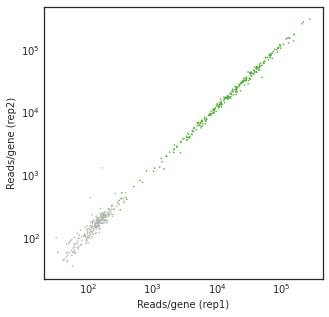

In [26]:
plt.style.use('seaborn-white')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(5,5))
ax=sns.scatterplot(spotscorr['1'],spotscorr['2'],s=10,c=listcols2,marker='.',linewidth=0)
ax.set_xscale("log")
ax.set_yscale("log")
plt.xlabel('Reads/gene (rep1)')
plt.ylabel('Reads/gene (rep2)')
plt.savefig('../../figures/celltype_identification_multisection/scatter_reads_frequencies_12.pdf')

/home/sergioms/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


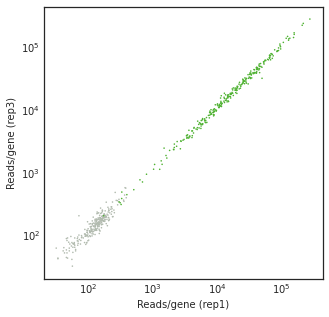

In [27]:
plt.style.use('seaborn-white')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(5,5))
ax=sns.scatterplot(spotscorr['1'],spotscorr['3'],s=10,c=listcols2,marker='.',linewidth=0)
ax.set_xscale("log")
ax.set_yscale("log")
plt.xlabel('Reads/gene (rep1)')
plt.ylabel('Reads/gene (rep3)')
plt.savefig('../../figures/celltype_identification_multisection/scatter_reads_frequencies_13.pdf')

We concatenate the three adata objects together

In [12]:
adata=sc.concat([adata1,adata2,adata3])
adata.obs['total_counts']=adata.obs['transcript_counts']

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Read and combine the home made (hm) datasets

Combining the data comming from the mouse section profiled with our own machine, aka 'real_mouse'

In [ ]:
reading_path=r'../../data/unprocessed_adata'
adata_realmouse1=sc.read(reading_path+'/realmouse_1_nuclei.h5ad')
adata_realmouse1.obs['replicate']='hm1'
reading_path=r'../../data/unprocessed_adata'
adata_realmouse2=sc.read(reading_path+'/realmouse_2_nuclei.h5ad')
adata_realmouse2.obs['replicate']='hm2'
reading_path=r'../../data/unprocessed_adata'
adata_realmouse3=sc.read(reading_path+'/realmouse_3_nuclei.h5ad')
adata_realmouse3.obs['replicate']='hm3'
reading_path=r'../../data/unprocessed_adata'
adata_realmouse4=sc.read(reading_path+'/realmouse_4_nuclei.h5ad')
adata_realmouse4.obs['replicate']='hm4'
adata_realmouse=sc.concat([adata_realmouse1,adata_realmouse2,adata_realmouse3,adata_realmouse4])
adata_realmouse.write(saving_path+'/realmouse_all_nuclei.h5ad')

## Combine the hm and 10x datasets together

Finally, we combine all mouse brain tissues in a single adata

In [41]:
saving_path=r'../../data/processed_adata/'
adata_multi=sc.read(saving_path+'/adata_msbrain_multisection_nuclei.h5ad')
adata=sc.concat([adata_multi,adata_realmouse])
adata.write(saving_path+'/adata_msbrain_multisection_&hm_nuclei.h5ad')

# 2. Preprocessing the datasets

Next, we will filter cells based on minimum amount of counts

In [38]:
sc.pp.filter_cells(adata,min_counts=40)
sc.pp.filter_cells(adata,min_genes=15)

We now save the raw data in adata.raw and apply normalization and log-transformation to minimize the effect of outliers. We also scale the data to give the same importance to all genes in clustering

In [12]:
adata.raw=adata
adata.layers['raw']=adata.X
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

[OPTIONAL] After normalizing and logmarizing, the data we CAN, if we wish, filter only highly variable genes for clustering. This step is key in the analysis of single cell RNA sequencing datasets (with +20.000 genes) but it's not that useful in targeted methods such as ISS. However, it can help to keep variables only for clustering

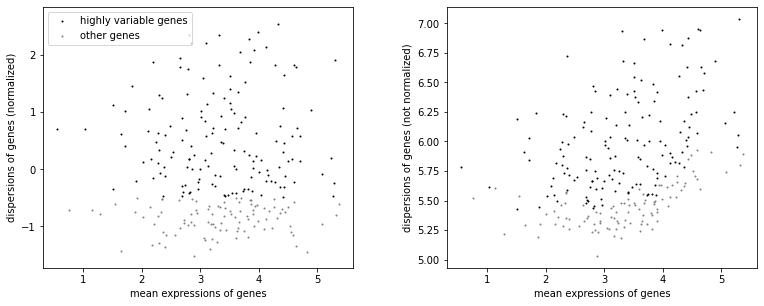

In [14]:
plt.rcParams['figure.facecolor'] = 'white'
sc.pp.highly_variable_genes(adata, min_mean=0.3, max_mean=7, min_disp=-0.5)
sc.pl.highly_variable_genes(adata)

# Dimensional reduction and clustering

We apply principal component analysis to find the appropiate nubmer of components to use to perform dimensionality reduction and clustering

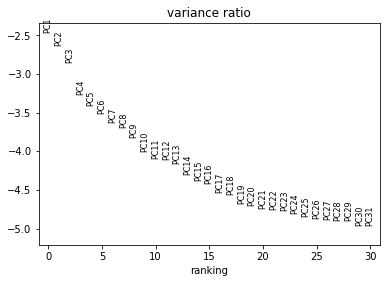

In [15]:
sc.tl.pca(adata, svd_solver='arpack')
plt.rcParams['figure.facecolor'] = 'white'
sc.pl.pca_variance_ratio(adata, log=True)

We select to go with the top X first principal components to look for the nearest neighbors. We are going to represent our data using graph-based methods, like UMAP. For this, we first need to create a graph by linking each cell to the n closest neighbors (n_neighbors) in the dataset. We can select the numbers of principal components to use

In [ ]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=0)

We can, then, run clustering, by calling either leiden or louvain clustering. By changing the parameter "resolution" we will generate more or less clusters. Higher resolution means more clusters. The clusters (groups of cells) are indepent from its visualization, which we will create using UMAP later on

In [22]:
sc.tl.leiden(adata,resolution=2.2,key_added='leiden_2_2')
sc.tl.leiden(adata,resolution=1.4,key_added='leiden_1_4')
sc.tl.leiden(adata,resolution=0.6,key_added='leiden_0_6')

To VISUALIZE the diversity of our cells, We perfrom UMAP. The closest two spots are in UMAP, the more similar they will be. With the comand sc.tl.umap. we CALCULATE the UMAP embedding. With sc.pl.umap will VISUALIZE the UMAP.

In [23]:
sc.tl.umap(adata,min_dist=0.1)

On top of the UMAP you can visualize any variable that you might be interested (a metadata column or gene expression). We need to modify the parameter "color" to visualize the appropiate variable on the UMAP

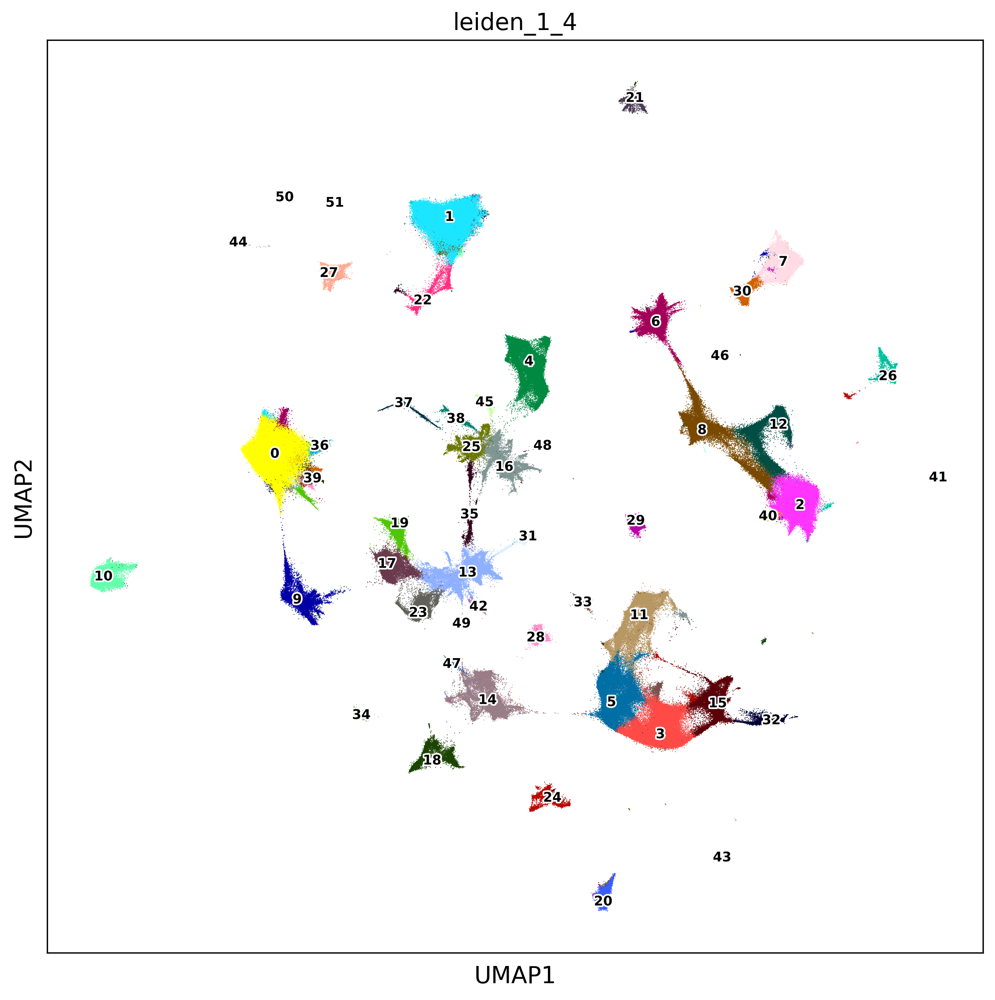

In [132]:
sc.set_figure_params(scanpy=True, dpi=150,figsize=(10,10))
plt.rcParams['figure.facecolor'] = 'white'
sc.pl.umap(adata,color=['leiden_1_4'],size=1,legend_loc='on data',legend_fontsize=8,legend_fontoutline=2,show=True)

We also want to store the umap colored by sample. 

In [ ]:
sc.set_figure_params(scanpy=True, dpi=150,figsize=(10,10))
plt.rcParams['figure.facecolor'] = 'white'
sc.pl.umap(adata,color=['replicate'],size=1,legend_fontsize=8,legend_fontoutline=2,show=False)
plt.savefig('../../figures/celltype_identification_multisection/msbrain_multisection_leiden_1_4_ondata_nuclei.pdf',bbox_inches='tight')

We next plot spatial plots

In [ ]:
adata.obs['X']=adata.obs['x_centroid']*4.70588
adata.obs['Y']=adata.obs['y_centroid']*4.70588
adata.obs['X_umap']=list(pd.DataFrame(adata.obsm['X_umap'])[0])
adata.obs['Y_umap']=list(pd.DataFrame(-adata.obsm['X_umap'])[1])
for rep in adata.obs['replicate'].unique():
    adatasub=adata[adata.obs['replicate']==rep]
    adatasub.obs['leiden_1_4']=adatasub.obs['leiden_1_4'].astype(str)
    sc.pl.umap(adatasub,color='leiden_1_4')
    map_of_clusters(adatasub,key='leiden_1_4',size=3,background='white',clusters='all',figuresize=(round(adatasub.obs['X'].max()/2000),round(adatasub.obs['Y'].max()/2000)),save=None)#,save='../../figures/celltype_identification_multisection/'+str(rep)+'_nuclei',format='png')


Finally, before saving we transform the XY to coordinate space so that we can visualize it on top of the nuclear stainings

In [26]:
for rep in adata.obs['replicate'].unique():
    adatasub=adata[adata.obs['replicate']==rep]
    adatasubobs=adatasub.obs
    adatasubobs.to_csv('../../data/celltyping_csv/mousebrain_multisection_rep'+str(rep)+'.csv')

## Saving the AnnData Object

In [143]:
saving_path=r'../../data/processed_adata/'
adata.X = sp.sparse.csr_matrix(adata.X)
adata.write(saving_path+'/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

## Read the data again (if needed)

In [8]:
saving_path=r'../../data/processed_adata/'
adata=sc.read(saving_path+'/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

/home/sergio/anaconda3/envs/xb/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Next, we will save the umap, colored by dataset of source (either home made or preview)

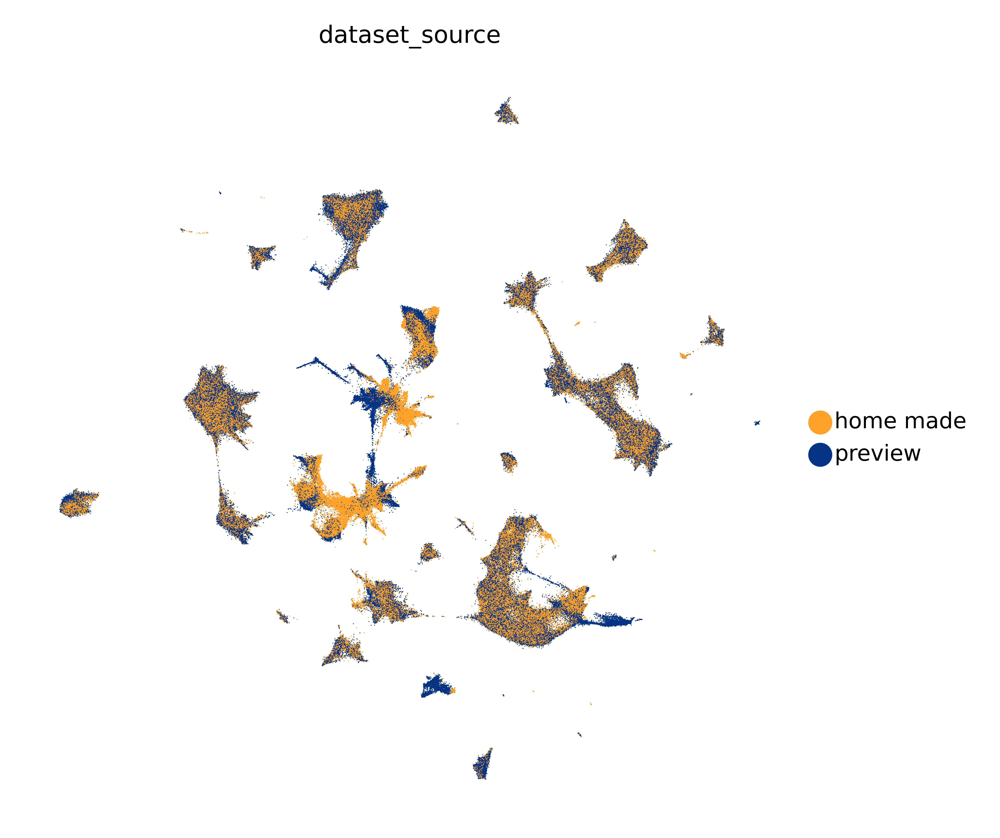

In [456]:
repdic={'1':'preview', '2':'preview', '3':'preview', 'hm1':'home made', 'hm2':'home made', 'hm3':'home made', 'hm4':'home made'}
adata.obs['dataset_source']=adata.obs['replicate'].map(repdic)
adata.uns['dataset_source_colors']=['#ffa229','#053485']
adata.obs['total_genes']=list(np.sum(adata.raw.X>0,axis=1))

sc.set_figure_params(scanpy=True, dpi=700, dpi_save=700, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
np.random.seed(0)
random_indices=np.random.permutation(list(range(adata.shape[0])))
sc.pl.umap(adata[random_indices,:],color='dataset_source',s=0.3,show=False)
plt.savefig('../../figures/celltype_identification_multisection_nuclei/UMAP_hm_vs_predesigned.pdf',bbox_inches='tight')

We also store the total counts obtained by each of the experiment types in th form of a violin plot

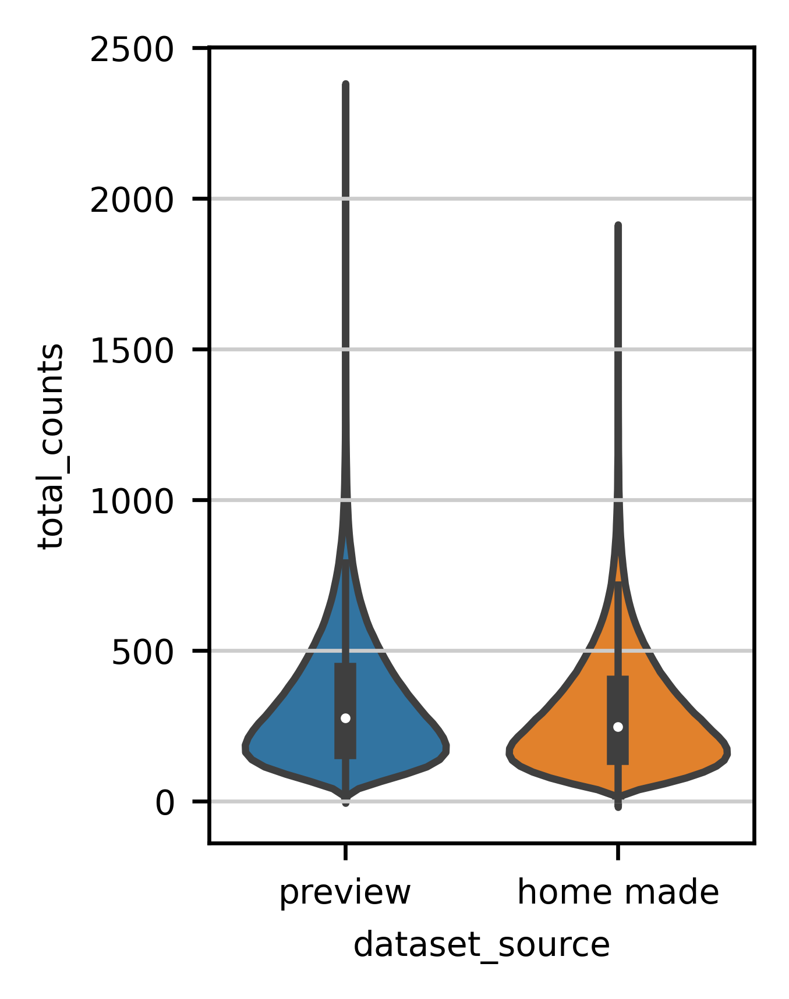

In [14]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
np.random.seed(0)
plt.figure(figsize=(2,3))
sns.violinplot(data=adata.obs,x='dataset_source',y='total_counts',figuresize=(6,3),split=True)
plt.savefig('../../figures/celltype_identification_multisection_nuclei/violin_total_all_counts_hm_vs_preview.pdf',bbox_inches='tight')

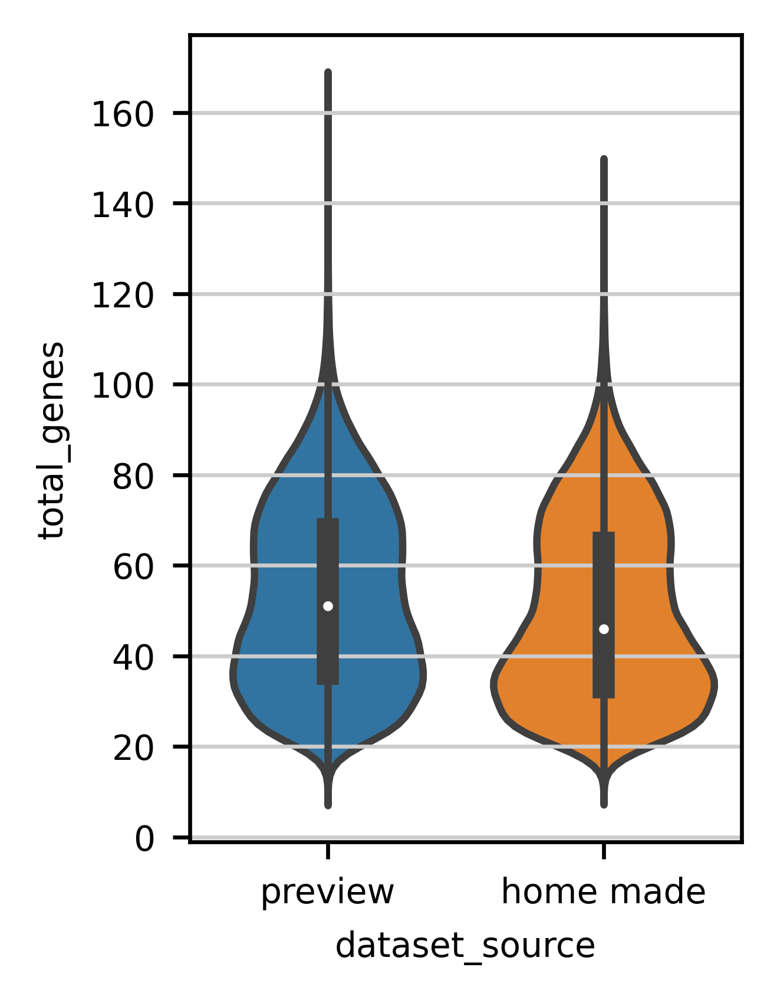

In [20]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
np.random.seed(0)
plt.figure(figsize=(2,3))
sns.violinplot(data=adata.obs,x='dataset_source',y='total_genes',figuresize=(6,3),split=True)
plt.savefig('../../figures/celltype_identification_multisection_nuclei/violin_total_all_genes_hm_vs_preview.pdf',bbox_inches='tight')

we can divide the violin plot per dataset

In [ ]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(10,3))
sns.violinplot(data=adata.obs,x='replicate',y='total_counts',figuresize=(6,3),split=True)
plt.savefig('../../figures/celltype_identification_multisection_nuclei/violin_total_counts_hm_vs_preview.pdf',bbox_inches='tight')

we also compute the same, but for genes

In [ ]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(10,3))
sns.violinplot(data=adata.obs,x='replicate',y='total_genes',figuresize=(6,3),split=True)
plt.savefig('../../figures/celltype_identification_multisection_nuclei/violin_total_genes_hm_vs_preview.pdf',bbox_inches='tight')

we also assess the correlation between both types of experiments in terms of gene expression

In [129]:
expression=pd.DataFrame(adata.raw.X)
expression['dataset_source']=list(adata.obs['dataset_source'])
expression_by_group=expression.groupby('dataset_source').mean().transpose()
np.corrcoef(expression_by_group['home made'],expression_by_group['preview'])[0,1]

0.9754110883065357

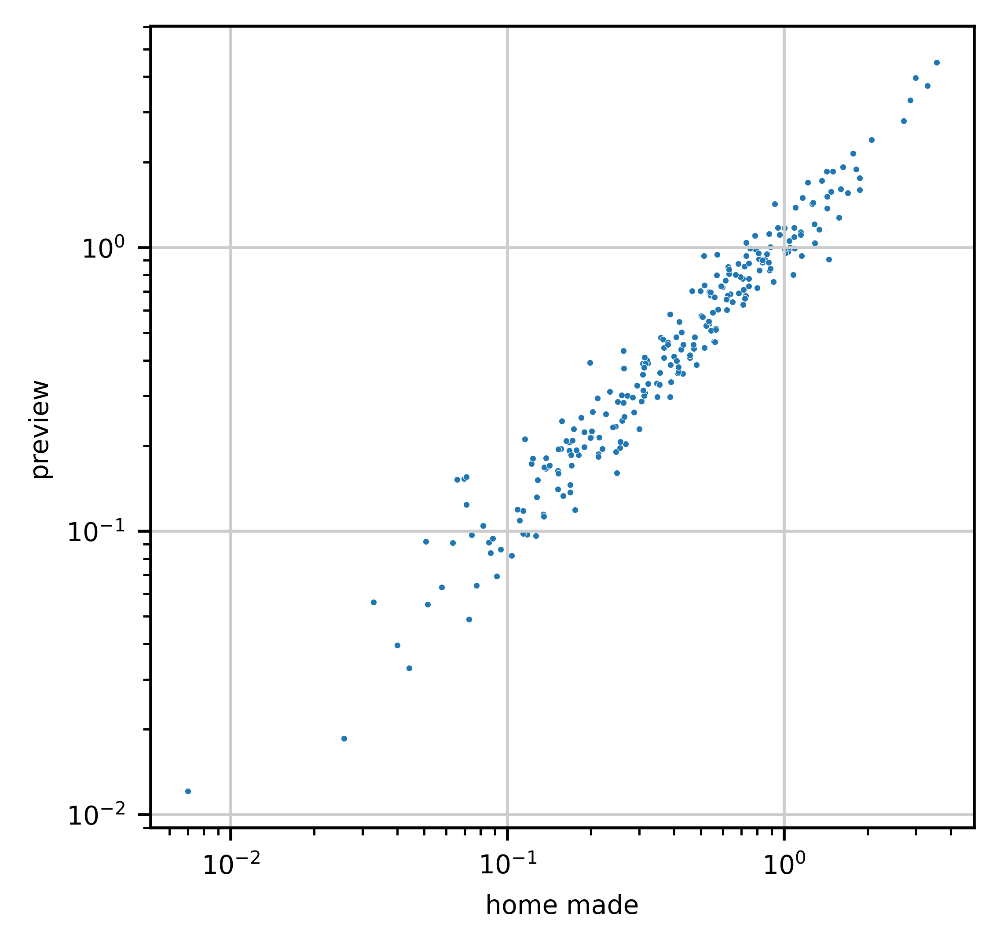

In [458]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.facecolor'] = 'white'
sns.scatterplot(x=expression_by_group['home made'],y=expression_by_group['preview'],s=3)
plt.xscale('log')
plt.yscale('log')
plt.savefig('../../figures/celltype_identification_multisection_nuclei/mean_expression_by_gene.pdf',bbox_inches='tight')

In [31]:
expression=pd.DataFrame(adata.raw.X)
expression['replicate']=list(adata.obs['replicate'])
expression_by_group=expression.groupby('replicate').sum().transpose()

0.9997020863047367


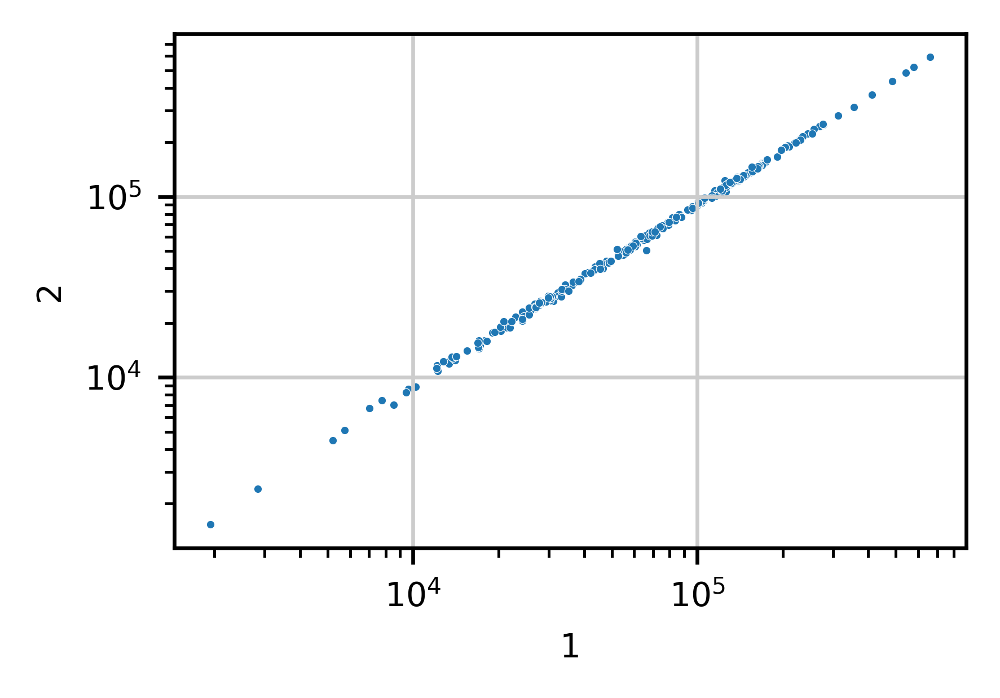

In [35]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
plt.figure(figsize=(3,2))
print(np.corrcoef(expression_by_group['1'],expression_by_group['2'])[0,1])
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.facecolor'] = 'white'
sns.scatterplot(x=expression_by_group['1'],y=expression_by_group['2'],s=3)
plt.xscale('log')
plt.yscale('log')
plt.savefig('../../figures/celltype_identification_multisection_nuclei/total_expression_by_gene_rep12.pdf',bbox_inches='tight')

we also compare the correlation between samples in terms of their cell type proportions

0.9992809656756284


<Figure size 600x270 with 0 Axes>

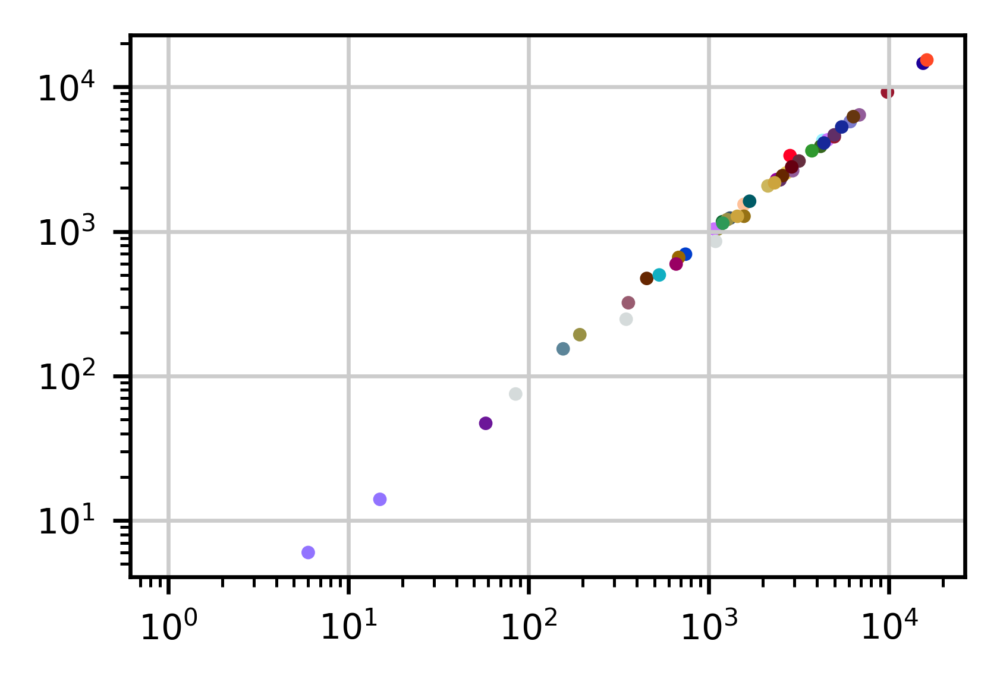

In [53]:
celltypes_by_region=pd.crosstab(adata.obs['Class'],adata.obs['replicate'])
plt.figure(figsize=(2,0.9))
fig, ax = plt.subplots(figsize=(3,2))
print(np.corrcoef(celltypes_by_region['1'],celltypes_by_region['2'])[0,1])
ax.scatter(celltypes_by_region['1'],celltypes_by_region['2'],c=adata.uns['Class_colors'],s=3)
plt.xscale('log')
plt.yscale('log')
plt.grid('off')
plt.savefig('../../figures/celltype_identification_multisection_nuclei/celltype_by_dataset12_scatter.pdf',bbox_inches='tight')

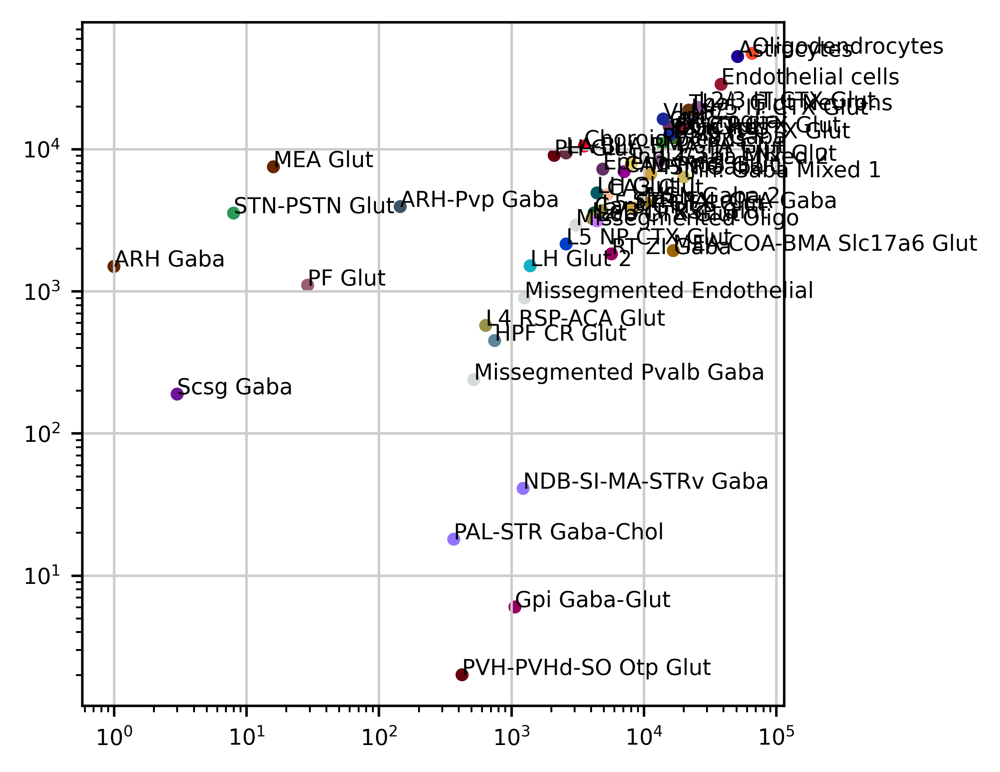

In [494]:
celltypes_by_region=pd.crosstab(adata.obs['Class'],adata.obs['dataset_source'])
fig, ax = plt.subplots()
ax.scatter(celltypes_by_region['home made'],celltypes_by_region['preview'],c=adata.uns['Class_colors'],s=10)
plt.xscale('log')
plt.yscale('log')
for i, txt in enumerate(celltypes_by_region.index):
    #print(txt)
    #if i>30:
    ax.annotate(txt, (celltypes_by_region.loc[txt,'home made'], celltypes_by_region.loc[txt,'preview']))
plt.grid('off')
plt.savefig('../../figures/celltype_identification_multisection_nuclei/celltype_by_source_scatter.pdf',bbox_inches='tight')

# Explore differentially expressed genes 

finally, we also explore differentially expressed genes by cluster to identify their cell type

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='leiden_1_4', method='wilcoxon')
sc.tl.dendrogram(adata,groupby='leiden_1_4')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=2, swap_axes=True)#,save='deg.pdf')
sc.pl.rank_genes_groups(adata, n_genes=4,fontsize=20)#,save='deg.pdf')

# 3. Annotate theclusters

Based on the previously generated plots, we annotated the different populations. the annotation is stored in a csv that we will read, convert to dictionary and applied it to the data. We save the output an h5ad

In [4]:
saving_path=r'../../data/processed_adata/'
adata=(saving_path+'/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

/home/sergio/anaconda3/envs/xb/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [399]:
class_ann=pd.read_csv(r"../../data/annotation_dictionaries/number_to_annotation_cluster_multi_hm_only_nuclei.csv",sep=',')
cls=dict(zip(class_ann['cluster_1_4'],class_ann['Class']))
cls_cl=dict(zip(class_ann['Class'],class_ann['Color']))
adata.obs['Class']=adata.obs['leiden_1_4'].astype(int).map(cls)
adata.uns['Class_colors']=[cls_cl[c] for c in np.unique(adata.obs['Class'])]

In [ ]:
saving_path=r'../../data/processed_adata/'
adata.write(saving_path+'/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

# 4. Generate plots with cell types (stored in Class)

In [2]:
saving_path=r'../../../Xenium_benchmarking-main/data/processed_adata/'
adata=sc.read(saving_path+'/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

/home/sergio/anaconda3/envs/xb/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


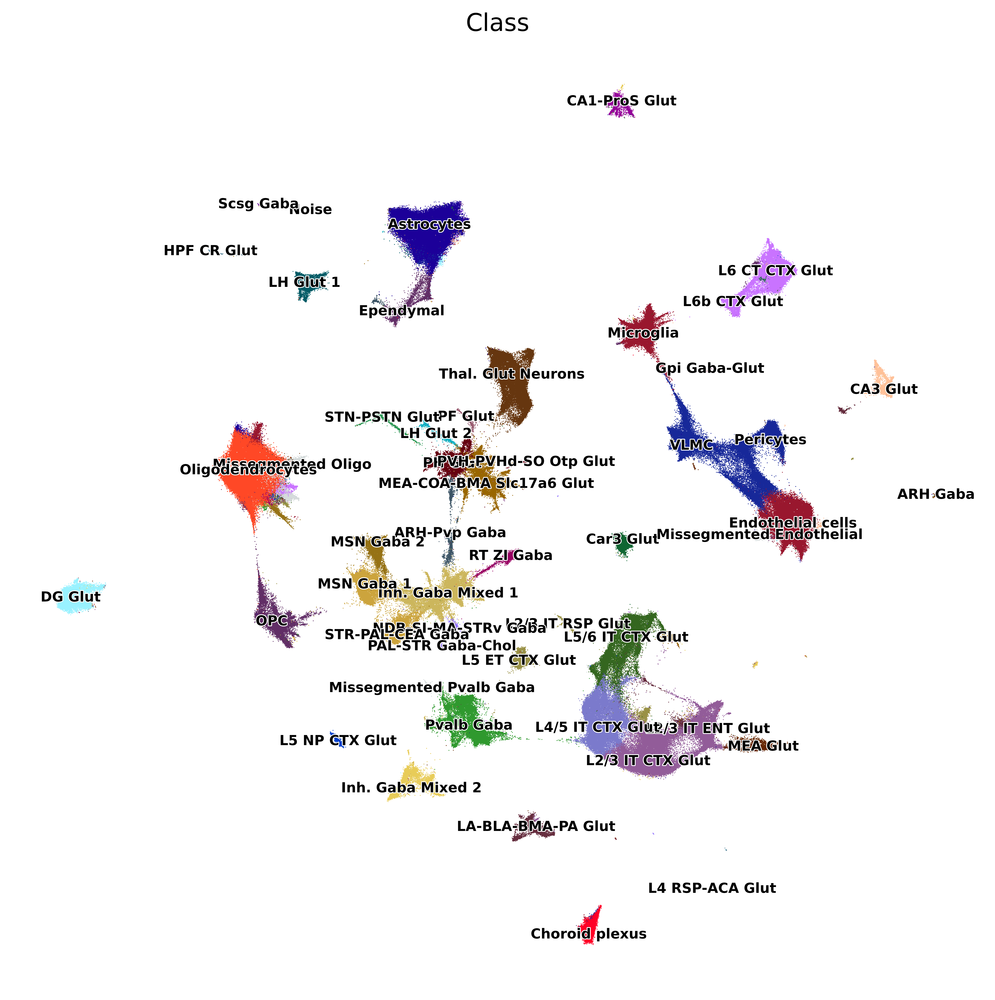

In [14]:
sc.set_figure_params(scanpy=True, dpi=400,figsize=(10,10))
plt.rcParams['figure.facecolor'] = 'white'
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.umap(adata,color=['Class'],size=1,legend_loc='on data',legend_fontsize=8,legend_fontoutline=1,show=False)
plt.axis('off')
plt.savefig('../../figures/celltype_identification_multisection/msbrain_multisection_Class_ondata_nuclei.pdf',bbox_inches='tight')

We generate and store spatial maps with annotated cell types (Class)

In [ ]:
adata.obs['X']=adata.obs['x_centroid']*4.70588
adata.obs['Y']=adata.obs['y_centroid']*4.70588
adata.obs['X_umap']=list(pd.DataFrame(adata.obsm['X_umap'])[0])
adata.obs['Y_umap']=list(pd.DataFrame(-adata.obsm['X_umap'])[1])
adata.obs['replicate'].unique()
for rep in adata.obs['replicate'].unique():
    adatasub=adata[adata.obs['replicate']==rep]
    adatasub.obs['Class']=adatasub.obs['Class'].astype(str)
    sc.pl.umap(adatasub,color='Class')
    map_of_clusters(adatasub,key='Class',size=5,background=None,clusters='all',figuresize=(round(adatasub.obs['X'].max()/1400),round(adatasub.obs['Y'].max()/1400)),save='../../../Xenium_benchmarking-main/figures/celltype_identification_multisection/'+str(rep)+'_nuclei',format='pdf')
    plt.grid('off')

# Assign the annotated domain to each of the cells (for section 1)

First we read the AnnData object, in case it's needed

In [ ]:
saving_path=r'../../data/processed_adata/'
adata=sc.read(saving_path+'/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

To further analyze the dataset, we manually annoated the regions/ tissue domains present in the dataset using Napari. 
We next import the annotations and apply them to our dataset. We did this for section 1 (multisection 1)

In [ ]:
ob=open('/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/figures/polygons/regions_multisection_1.json')
js=json.load(ob)
output=pd.DataFrame(columns=['y','x','region_annotation','region_general'])
nu=0
for ob in js:
    for num in range(0,len(ob['coordinates'][0])):
        output.loc[nu,:]=list([ob['coordinates'][0][num][0],ob['coordinates'][0][num][1],ob['name'],ob['name'].replace(' [1]','').replace('D: ','')])
        nu=nu+1
dictio_region=dict(zip(output['region_annotation'],output['region_general']))
dictio_region['D: vl [2]']='vl'

/home/sergio/anaconda3/envs/xb/lib/python3.7/site-packages/ipykernel_launcher.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  This is separate from the ipykernel package so we can avoid doing imports until


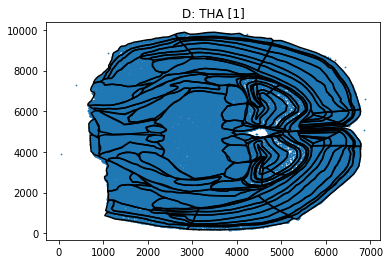

In [63]:
adata.layers['raw']=adata.raw.X
adatar1=adata[adata.obs['replicate']=='1']
pls=output
pls['x']=pls['x']*0.2125
pls['y']=pls['y']*0.2125
adatar1=domainassign(pls,adatar1)

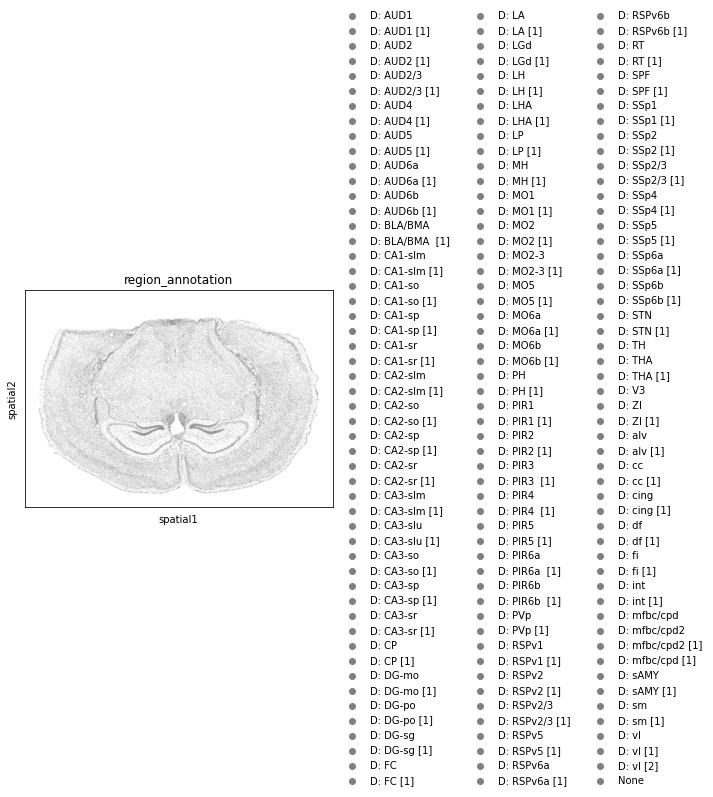

In [72]:
adatar1.obsm['spatial']=np.array(adatar1.obs.loc[:,['x_centroid','y_centroid']])
sc.pl.spatial(adatar1,color='region_annotation',spot_size=10)

 Next, we will assign the cells that are just outside all regions to their closest regions. This is done because we might have polygons that miss some cells

In [207]:
nancells=adatar1[adatar1.obs['region_annotation']=='None'] 
annotatedcells=adatar1[adatar1.obs['region_annotation']!='None']
nancells.obs['new_domain']='nan'
print('caclulating distance to vessel...')
for rd in tqdm(nancells.obs.index):
        meas=((annotatedcells.obs.X-nancells.obs.loc[rd,'X'])**2)+((annotatedcells.obs.Y-nancells.obs.loc[rd,'Y'])**2)
        nancells.obs.loc[rd,'new_domain']=meas.idxmin()
dican=dict(zip(annotatedcells.obs.index,annotatedcells.obs['region_annotation']))
nancells.obs['new_domain']=nancells.obs['new_domain'].map(dican)
new_assignment=dict(zip(nancells.obs.index,nancells.obs['new_domain']))
for indi in nancells.obs.index:
    adatar1.obs.loc[indi,'region_annotation']=new_assignment[indi]

/home/sergio/anaconda3/envs/xb/lib/python3.7/site-packages/ipykernel_launcher.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  after removing the cwd from sys.path.


caclulating distance to vessel...


0it [00:00, ?it/s]


Besides the annotation of the deepest annotation, we also want to have a hierarchical annotation of regions. For this, we annotate all regions in a hierarchical way to define more general structures. We will read this table and generate dictionaries to assign each cell to a specific region in the different hierarchy levels

In [211]:
domain_level=pd.read_csv("../../data/annotation_dictionaries/ABA_domain_annotation_dictionary_whole_coronal.csv",sep=';')
adatar1.obs['region_level4']=adatar1.obs['region_annotation'].map(dictio_region)
lv4lv3=dict(zip(domain_level['level4'],domain_level['level3']))
lv4lv2=dict(zip(domain_level['level4'],domain_level['level2']))
lv4lv1=dict(zip(domain_level['level4'],domain_level['level1']))
adatar1.obs['region_level3']=adatar1.obs['region_level4'].map(lv4lv3)
adatar1.obs['region_level2']=adatar1.obs['region_level4'].map(lv4lv2)
adatar1.obs['region_level1']=adatar1.obs['region_level4'].map(lv4lv1)
adatar1.obs['region_level4']=adatar1.obs['region_level4'].astype(str)
lv4color=dict(zip(domain_level['level4'],domain_level['color']))
lv4color['nan']='white'
adatar1.uns['region_level4_colors']=[lv4color[el] for el in np.unique(adatar1.obs['region_level4']).astype(str)]

# Similarity in expression between regions

We compute similarity in mean expression between regions

In [219]:
expressr1=adatar1.to_df()
expressr1['region_level4']=adatar1.obs['region_level4']
mean_expression_by_region=expressr1.groupby('region_level4').mean()
meanexp=pd.DataFrame(index=mean_expression_by_region.index,columns=mean_expression_by_region.index)
for ind in meanexp.index:
    for col in meanexp.columns:
        meanexp.loc[ind,col]=np.corrcoef(mean_expression_by_region.loc[ind,:],mean_expression_by_region.loc[col,:])[0,1]

In [221]:
sns.clustermap(meanexp.astype(float),figsize=(40,40),vmax=0.95,vmin=0.5,cmap='viridis')

In [222]:
meanexp.to_csv('../../figures/2.comparison_between_datasets/with_regional_anno/correlation_between_domains_r1_multisection.csv')

# Saving the AnnData with Regions

In [ ]:
sadatar1.obs['spatial annotation']=adatar1.obs['region_main']
saving_path=r'../../data/processed_adata/'
adatar1.write(saving_path+'adata_multisection_r1_with_Annotations.h5ad')

In [ ]:
saving_path=r'../../data/processed_adata/'
adatar1.write('../../figures/2.comparison_between_datasets/with_regional_anno/anno_r1_multisection_Xenium.h5ad')

We plot the annotated regions in the tissue

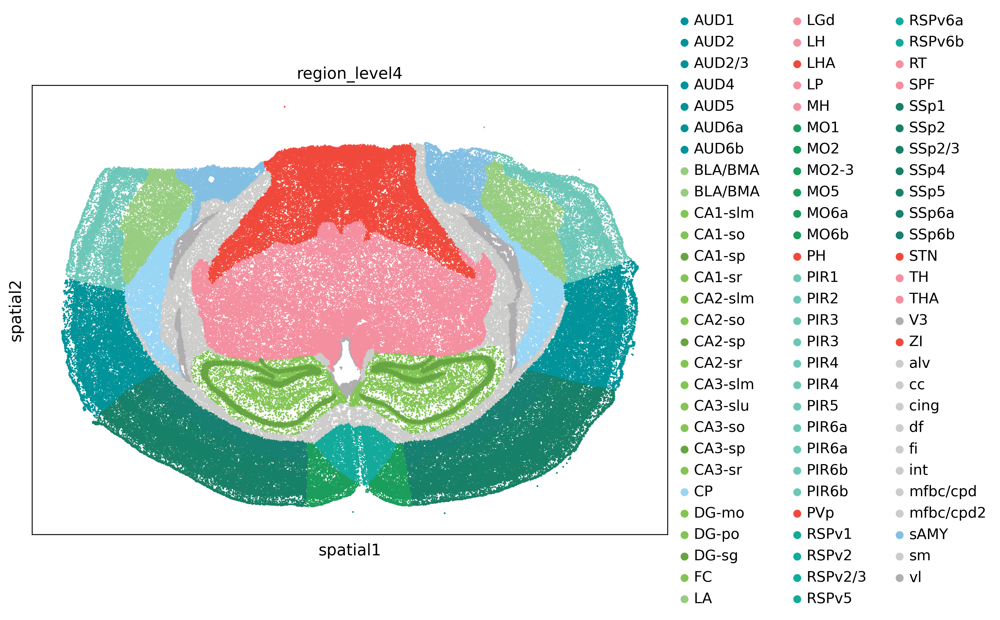

In [20]:
sc.set_figure_params(scanpy=True, dpi=150,figsize=(10,10))
plt.rcParams['figure.facecolor'] = 'white'
sc.pl.spatial(adatar1,color='region_level4',spot_size=30,save=None,show=False)
plt.savefig('../../figures/celltype_identification_multisection/msbrain_multisection_r1_tissue_domains_map_level4_mousebrain_r1.pdf')

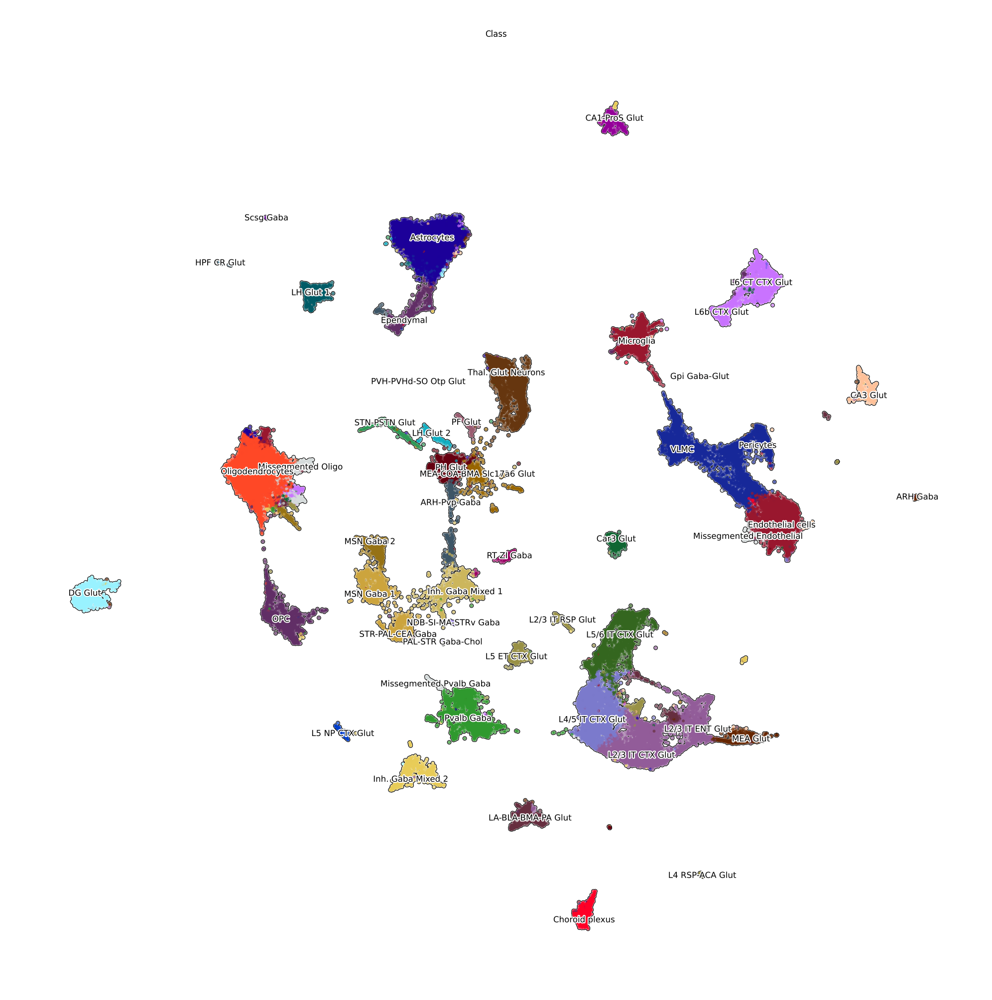

In [165]:
sc.pl.umap(adatanew,color=['Class'],size=2,add_outline=True,legend_fontweight='light',outline_width=[0.2,0.05],show=False,legend_fontoutline=0.5,legend_loc='on data')
plt.savefig('../../figures/celltype_identification_multisection/msbrain_multisection_r1_Class_ondata_nuclei.pdf',bbox_inches='tight')

We save the UMAP of cells in mssection 1 colored by region.

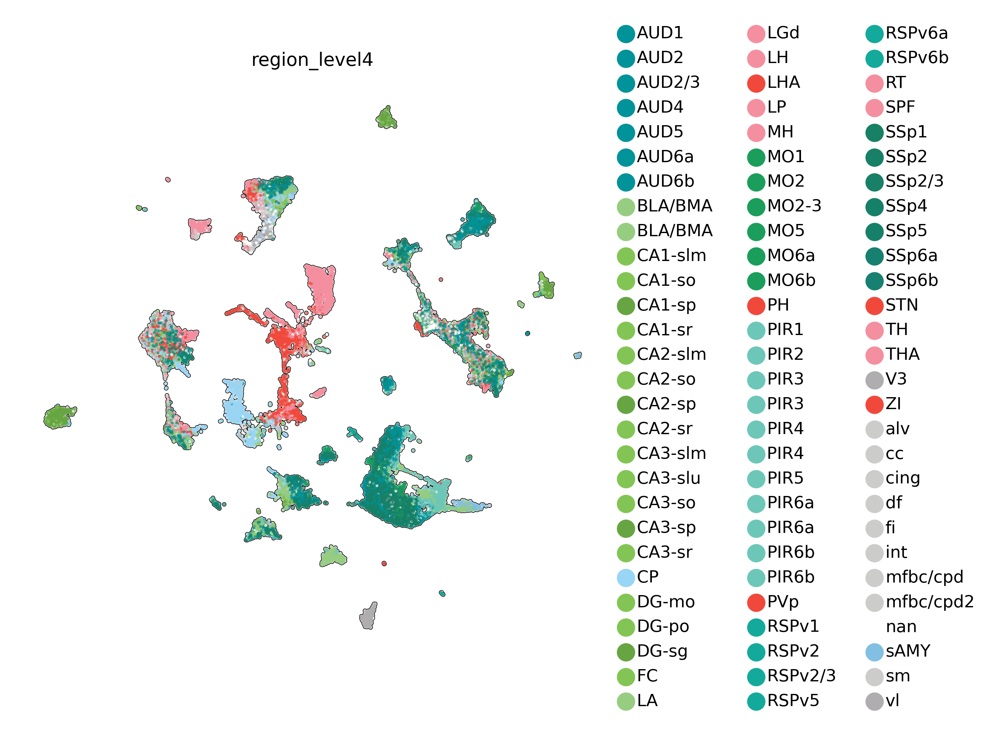

In [166]:
sc.pl.umap(adatanew,color=['region_level4'],size=5,add_outline=True,outline_width=[0.2,0.05],show=False)
plt.savefig('../../figures/celltype_identification_multisection/msbrain_multisection_region_level4_nuclei.pdf',bbox_inches='tight')

We also save a heatmap showing the cell type composition of all regions

In [175]:
ct=pd.crosstab(adatanew.obs['Class'],adatanew.obs['region_level4'])
ct=ct.div(np.sum(ct,axis=0),axis=1)
sns.clustermap(ct,standard_scale='var',cmap='Greens',figsize=(15,10))
plt.savefig('../../figures/celltype_identification_multisection/Class_by_region_level4_confusion_heatmap.pdf',bbox_inches='tight')

Finally, we will save the UMAP, colored by region, but highlighing specific cell types

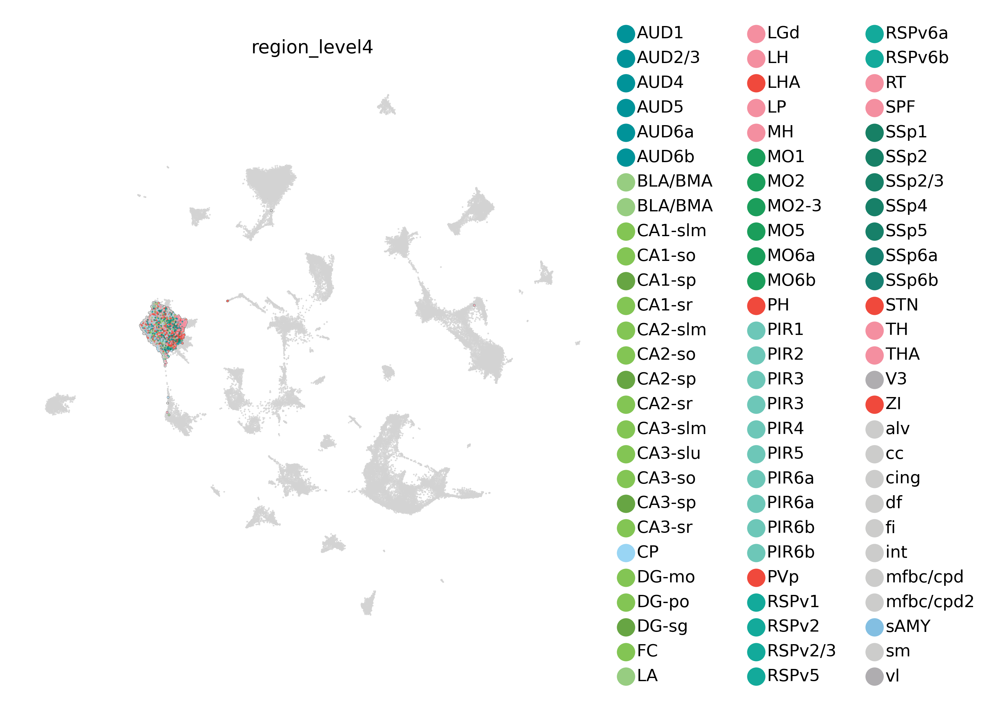

In [ ]:
adata_oligo=adatar1[adatar1.obs['Class']=='Oligodendrocytes']
ax=sc.pl.umap(adatar1,size=1,add_outline=True,outline_width=[0,0],show=False)
ax=sc.pl.umap(adata_oligo,color=['region_level4'],size=2,add_outline=True,outline_width=[0.1,0.05],show=False,ax=ax)
plt.savefig('../../figures/celltype_identification_multisection/msbrain_Oligo_by_domain_Oligodendrocytes_nuclei.pdf',bbox_inches='tight')

adata_oligo=adatar1[adatar1.obs['Class']=='Astrocytes']
ax=sc.pl.umap(adatar1,size=1,add_outline=True,outline_width=[0,0],show=False)
ax=sc.pl.umap(adata_oligo,color=['region_level4'],size=2,add_outline=True,outline_width=[0.1,0.05],show=False,ax=ax)
plt.savefig('../../figures/celltype_identification_multisection/msbrain_Oligo_by_domain_Astrocytes_nuclei.pdf',bbox_inches='tight')

adata_oligo=adatar1[adatar1.obs['Class']=='Microglia']
ax=sc.pl.umap(adatar1,size=1,add_outline=True,outline_width=[0,0],show=False)
ax=sc.pl.umap(adata_oligo,color=['region_level4'],size=2,add_outline=True,outline_width=[0.1,0.05],show=False,ax=ax)
plt.savefig('../../figures/celltype_identification_multisection/msbrain_Oligo_by_domain_Microglia_nuclei.pdf',bbox_inches='tight')